In [1]:
!git clone https://github.com/esoyeon/Multilingual-StyleCLIP.git

Cloning into 'Multilingual-StyleCLIP'...
remote: Enumerating objects: 631, done.
remote: Counting objects: 100% (631/631), done.
remote: Compressing objects: 100% (464/464), done.
remote: Total 631 (delta 208), reused 558 (delta 145), pack-reused 0
Receiving objects: 100% (631/631), 101.85 MiB | 31.52 MiB/s, done.
Resolving deltas: 100% (208/208), done.


In [2]:
# set up
%tensorflow_version 1.x
! pip install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html 

# clip install
!pip install git+https://github.com/openai/CLIP.git 

# multilingual set up 
!pip install ftfy regex tqdm gdown
!pip install transformers

# Ninja set up
!wget https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
!sudo unzip ninja-linux.zip -d /usr/local/bin/
!sudo update-alternatives --install /usr/bin/ninja ninja /usr/local/bin/ninja 1 --force

TensorFlow 1.x selected.
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |███████████████████████         | 834.1 MB 1.2 MB/s eta 0:04:22tcmalloc: large alloc 1147494400 bytes == 0x55ebde2f8000 @  0x7f52470a1615 0x55eba59c44cc 0x55eba5aa447a 0x55eba59c72ed 0x55eba5ab8e1d 0x55eba5a3ae99 0x55eba5a359ee 0x55eba59c8bda 0x55eba5a3ad00 0x55eba5a359ee 0x55eba59c8bda 0x55eba5a37737 0x55eba5ab9c66 0x55eba5a36daf 0x55eba5ab9c66 0x55eba5a36daf 0x55eba5ab9c66 0x55eba5a36daf 0x55eba59c9039 0x55eba5a0c409 0x55eba59c7c52 0x55eba5a3ac25 0x55eba5a359ee 0x55eba59c8bda 0x55eba5a37737 0x55eba5a359ee 0x55eba59c8bda 0x55eba5a36915 0x55eba59c8afa 0x55eba5a36c0d 0x55eba5a359ee
     |█████████████████████████████▏  | 1055.7 MB 1.3 MB/s eta 0:01:20tcmalloc: large alloc 1434370048 bytes == 0x55ec2294e000 @  0x7f52470a1615 0x55eba59c44cc 0x55eba5aa447a 0x55eba59c72ed 0x55eba5ab8e1d 0x55eba5a3ae99 0x55eba5a359ee 0x55eba59c8bda 0x55eba5a3ad00 0x55eba5a359ee 0x55eba59c8bda 0x55eba5a37737 0x

In [8]:
%cd /content/Multilingual-StyleCLIP

/content/Multilingual-StyleCLIP


# Restyle Encoder

## Set up

In [9]:
# import libraries
from argparse import Namespace
import time
import sys
import pprint
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms

sys.path.append(".")
sys.path.append("..")

from models.RestyleEncoder.utils.common import tensor2im
from models.RestyleEncoder.psp import pSp

%load_ext autoreload
%autoreload 2

In [10]:
# Get pretrained model url
import os
current_directory = os.getcwd()
save_path = os.path.join(current_directory, "pretrained_models")
if not os.path.exists(save_path):
    os.makedirs(save_path)

download_command = r"""wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id={FILE_ID}' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id={FILE_ID}" -O {SAVE_PATH}/{FILE_NAME} && rm -rf /tmp/cookies.txt""".format(FILE_ID="1sw6I2lRIB0MpuJkpc8F5BJiSZrc0hjfE", FILE_NAME="restyle_psp_ffhq_encode.pt", SAVE_PATH=save_path)

## Inference Parameters

In [11]:
EXPERIMENT_ARGS = {
        "model_path": "pretrained_models/restyle_psp_ffhq_encode.pt",
        "image_path": "notebooks/images/face_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    }

In [12]:
# pretrained model 다운로드
if not os.path.exists(EXPERIMENT_ARGS['model_path']) or os.path.getsize(EXPERIMENT_ARGS['model_path']) < 1000000:
    print(f'Downloading ReStyle model for ffhq_encode...')
    os.system(f"wget {download_command}")
    # if google drive receives too many requests, we'll reach the quota limit and be unable to download the model
    if os.path.getsize(EXPERIMENT_ARGS['model_path']) < 1000000:
        raise ValueError("Pretrained model was unable to be downloaded correctly!")
    else:
        print('Done.')
else:
    print(f'ReStyle model for ffhq_encode already exists!')

Done.


In [ ]:
# 위에 코드 실패시...

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# restyle_psp_ffhq_encode.pt
ids = ['1sw6I2lRIB0MpuJkpc8F5BJiSZrc0hjfE']
for file_id in ids:
  downloaded = drive.CreateFile({'id':file_id})
  downloaded.FetchMetadata(fetch_all=True)
  downloaded.GetContentFile(downloaded.metadata['title'])

import shutil 

shutil.move('/content/Multilingual-StyleCLIP/restyle_psp_ffhq_encode.pt', '/content/Multilingual-StyleCLIP/pretrained_models/restyle_psp_ffhq_encode.pt')

## Load pretrained model

In [13]:
model_path = EXPERIMENT_ARGS['model_path']
ckpt = torch.load(model_path, map_location='cpu')

In [14]:
# check options
opts = ckpt['opts']
pprint.pprint(opts)

{'batch_size': 8,
 'board_interval': 50,
 'checkpoint_path': '',
 'dataset_type': 'ffhq_encode',
 'device': 'cuda:0',
 'encoder_type': 'BackboneEncoder',
 'exp_dir': '',
 'id_lambda': 0.1,
 'image_interval': 100,
 'input_nc': 6,
 'l2_lambda': 1.0,
 'learning_rate': 0.0001,
 'lpips_lambda': 0.8,
 'max_steps': 500000,
 'moco_lambda': 0,
 'n_iters_per_batch': 5,
 'optim_name': 'ranger',
 'output_size': 1024,
 'save_interval': 10000,
 'start_from_latent_avg': True,
 'stylegan_weights': '',
 'test_batch_size': 8,
 'test_workers': 8,
 'train_decoder': False,
 'val_interval': 10000,
 'w_norm_lambda': 0.0,
 'workers': 8}


In [15]:
# update the training options
opts['checkpoint_path'] = model_path

In [16]:
# load psp ffhq encoder
opts = Namespace(**opts)
net = pSp(opts)
    
net.eval()
net.cuda()
print('Model successfully loaded!')

Loading ReStyle pSp from checkpoint: pretrained_models/restyle_psp_ffhq_encode.pt
Model successfully loaded!


## Visualize Input

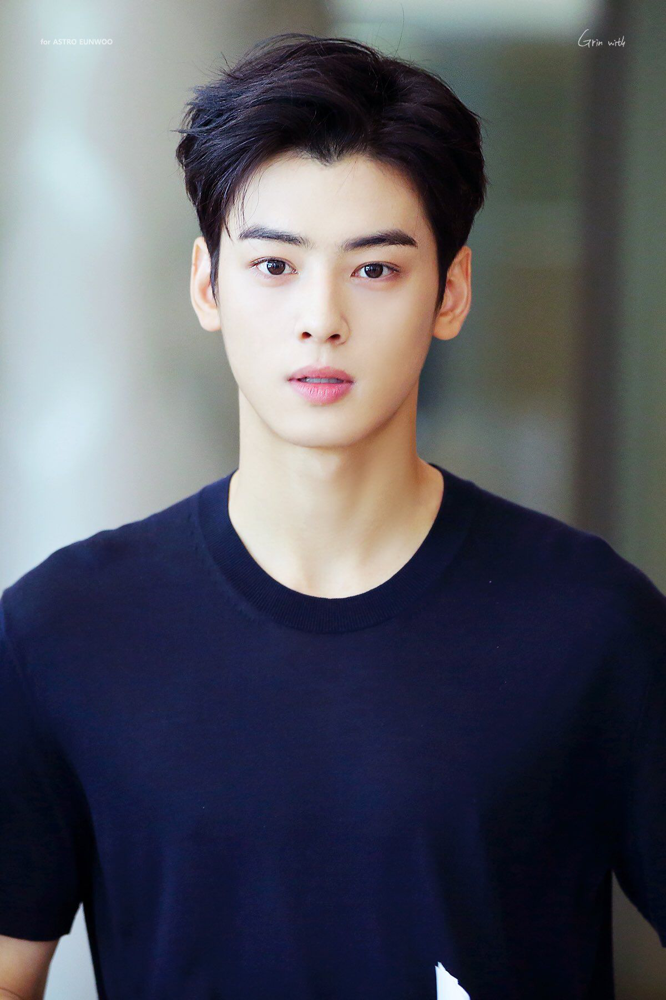

In [17]:
import urllib.request
import time

# 다운받을 이미지 url
url = 'https://img.theqoo.net/img/Gzpfs.jpg'

# 이미지 요청 및 다운로드
image_path = '/content/image2.jpg'
urllib.request.urlretrieve(url, image_path)

# 저장 된 이미지 확인
img = Image.open(image_path)
img

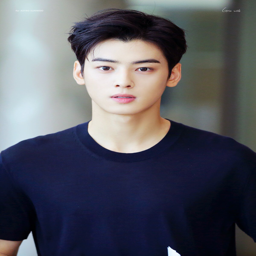

In [18]:
# load the image
original_image = Image.open(image_path).convert("RGB")

# resize
original_image = original_image.resize((256, 256))

# print the original image
original_image

## Align Image

In [19]:
# face detection
def run_alignment(image_path):
    import dlib
    from models.RestyleEncoder.align_faces_parallel import align_face
    if not os.path.exists("shape_predictor_68_face_landmarks.dat"):
        print('Downloading files for aligning face image...')
        os.system('wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2')
        os.system('bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2')
        print('Done.')
    predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
    aligned_image = align_face(filepath=image_path, predictor=predictor) 
    print("Aligned image has shape: {}".format(aligned_image.size))
    return aligned_image 

input_image = run_alignment(image_path)

Done.
Aligned image has shape: (256, 256)


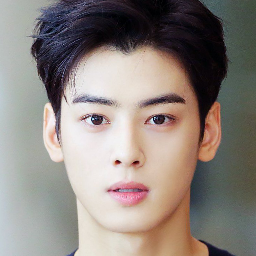

In [20]:
# resized input image
input_image.resize((256, 256))

## Perform Inference

In [21]:
img_transforms = EXPERIMENT_ARGS['transform']
transformed_image = img_transforms(input_image)

In [22]:
#  generate the image corresponding to the average latent code ->  initialize the iterative refinement process.
def get_avg_image(net):
    avg_image = net(net.latent_avg.unsqueeze(0),
                    input_code=True,
                    randomize_noise=False,
                    return_latents=False,
                    average_code=True)[0]
    avg_image = avg_image.to('cuda').float().detach()
    if experiment_type == "cars_encode":
        avg_image = avg_image[:, 32:224, :]
    return avg_image

In [23]:
opts.n_iters_per_batch = 5 # inference steps
opts.resize_outputs = False  # generate outputs at full resolution

In [24]:
from models.RestyleEncoder.utils.inference_utils import run_on_batch

experiment_type = 'ffhq_encode'
with torch.no_grad():
    # get average latent code
    avg_image = get_avg_image(net)
    tic = time.time()
    # inference
    result_batch, result_latents = run_on_batch(transformed_image.unsqueeze(0).cuda(), net, opts, avg_image)
    toc = time.time()
    print('Inference took {:.4f} seconds.'.format(toc - tic))

Inference took 0.6108 seconds.


In [25]:
# choose the last latents among 5 as encoded image
encoded_image = result_latents[0][-1]

In [26]:
# reshape the encoded image
encoded_image = torch.Tensor(encoded_image.reshape(1, 18, 512))
print(encoded_image)

tensor([[[-16.6644,   0.5936, -24.6472,  ..., -12.4237,  -3.3922, -10.0135],
         [ -6.3681, -23.4834, -35.4831,  ...,  37.4478, -10.6384,  13.4952],
         [-14.4546, -10.2385,   9.6846,  ..., -27.5559, -15.5015,  -2.6139],
         ...,
         [ -3.1547,   2.1094,  -0.8883,  ...,  -8.2591,  12.9379,   2.5940],
         [  3.6308,   0.8033,  -0.9030,  ...,   1.5122,   3.3006,   1.3686],
         [  1.8200,  -0.1564,  -0.3445,  ...,   2.1213,  -1.1208,  -0.2278]]])


In [27]:
# save the latents
torch.save(encoded_image, './latents2.pt')

## Visualize Result

In [ ]:
resize_amount = (256, 256) if opts.resize_outputs else (opts.output_size, opts.output_size)

In [ ]:
def get_coupled_results(result_batch, transformed_image):
    """
    Visualize output images from left to right (the input image is on the right)
    """
    result_tensors = result_batch[0]  # there's one image in our batch
    result_images = [tensor2im(result_tensors[iter_idx]) for iter_idx in range(opts.n_iters_per_batch)]
    input_im = tensor2im(transformed_image)
    res = np.array(result_images[0].resize(resize_amount))
    for idx, result in enumerate(result_images[1:]):
        res = np.concatenate([res, np.array(result.resize(resize_amount))], axis=1)
    res = np.concatenate([res, input_im.resize(resize_amount)], axis=1)
    res = Image.fromarray(res)
    return res

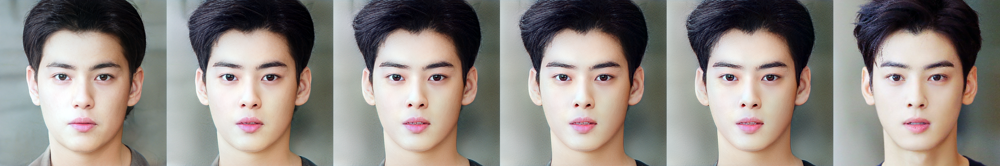

In [ ]:
# last image on the right => original image
res = get_coupled_results(result_batch, transformed_image)
res

# Mapper

## Set up

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os, random
import torch

In [ ]:
# multilingual clip weights 
!bash get-weights.sh

--2021-12-08 02:21:12--  https://www.dropbox.com/s/2oxu7hw0y9fwdqs/M-BERT-Base-69-ViT%20Linear%20Weights.pkl
Resolving www.dropbox.com (www.dropbox.com)... 162.125.66.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.66.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/2oxu7hw0y9fwdqs/M-BERT-Base-69-ViT%20Linear%20Weights.pkl [following]
--2021-12-08 02:21:12--  https://www.dropbox.com/s/raw/2oxu7hw0y9fwdqs/M-BERT-Base-69-ViT%20Linear%20Weights.pkl
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucf043990c57e787e7307c3f4b9a.dl.dropboxusercontent.com/cd/0/inline/BbZDIFGu6bdJzivvgFWn7PaELwjRoed9Q45qRRyN6pmvDpM216rx0928WvFrLfw2J38eoBzrm0PIJrcF-6jM_e6Tvf2lBKcWjDt-RUdDhZMZCKar9O02VPmfZxvcupM2aDgC5lMp8kxyf-_xDRorhp0I/file# [following]
--2021-12-08 02:21:13--  https://ucf043990c57e787e7307c3f4b9a.dl.dropboxusercontent.com/cd/0/inline/B

In [ ]:
# downloads StyleGAN's weights and facial recognition network weights
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

import os
current_directory = os.getcwd()
save_path = os.path.join(current_directory, "pretrained_models")
if not os.path.exists(save_path):
    os.makedirs(save_path)

os.chdir(save_path)    

# downloads StyleGAN's weights and facial recognition network weights
ids = ['1EM87UquaoQmk17Q8d5kYIAHqu0dkYqdT', '1N0MZSqPRJpLfP4mFQCS14ikrVSe8vQlL']
for file_id in ids:
  downloaded = drive.CreateFile({'id':file_id})
  downloaded.FetchMetadata(fetch_all=True)
  downloaded.GetContentFile(downloaded.metadata['title'])

os.chdir('/content/Multilingual-StyleCLIP')

## Inference

In [4]:
# mount on google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [55]:
checkpoint_path = '/content/drive/MyDrive/Colab Notebooks/styleCLIP/mapper_result/лицо с макияжем/checkpoints/best_model.pt'

In [56]:
%cd /content/Multilingual-StyleCLIP/models

/content/Multilingual-StyleCLIP/models


In [57]:
from utils import ensure_checkpoint_exists
from mapper.scripts.inference import run

# edit_type = '보라색 머리카락를 가진 사람' 
# edit_id = '보라색 머리카락를 가진 사람'
edit_type = 'лицо с макияжем' 
edit_id = 'лицо с макияжем'

os.makedirs("mapper/pretrained", exist_ok=True)
ensure_checkpoint_exists(checkpoint_path)
latent_path = "/content/Multilingual-StyleCLIP/latents2.pt" # {type:"string"} 
# if latent_path == "/content/drive/MyDrive/Colab Notebooks/styleCLIP/celebA/latents/latents13242.pt":
#   ensure_checkpoint_exists("example_celebs.pt")
n_images =  1

args = {
    "work_in_stylespace": False,
    "exp_dir": "results/",
    "checkpoint_path": checkpoint_path,
    "couple_outputs": True,
    "mapper_type": "LevelsMapper",
    "no_coarse_mapper": False,
    "no_medium_mapper": False,
    "no_fine_mapper": True,
    "stylegan_size": 1024,
    "test_batch_size": 1,
    "latents_test_path": latent_path,
    "test_workers": 1,
    "n_images": n_images
}

In [58]:
from argparse import Namespace
run(Namespace(**args))

Loading from checkpoint: /content/drive/MyDrive/Colab Notebooks/styleCLIP/mapper_result/лицо с макияжем/checkpoints/best_model.pt


100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

Runtime 0.0870+-0.0000


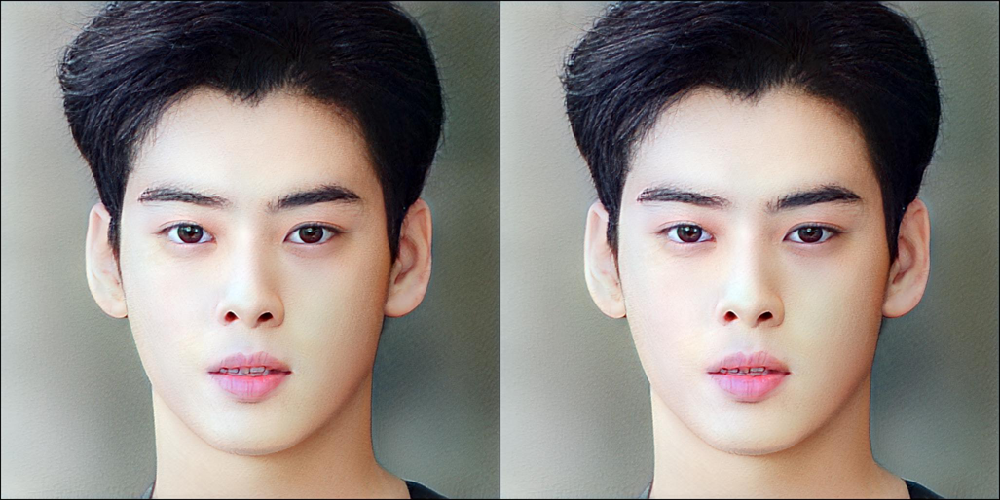

In [59]:
from PIL import Image
result = Image.open(f"results/inference_results/00000.jpg")
result = result.resize((int(result.width * 0.5), int(result.height * 0.5)))
grid = Image.new("RGB", (result.width, result.height * n_images))
grid.paste(result, (0, 0))
for i in range(1, n_images):
  result = Image.open(f"results/inference_results/{str(i).zfill(5)}.jpg")
  result = result.resize((int(result.width * 0.5), int(result.height * 0.5)))
  grid.paste(result, (0, int(result.height * i)))
grid